In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
zip_path = '/content/drive/My Drive/kaggle.zip'

In [3]:
import zipfile
import os

# Destination directory to extract files
extract_to = '/content/dataset'

# Unzipping
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print("Dataset extracted to:", extract_to)

Dataset extracted to: /content/dataset


In [4]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Dense, Flatten, Reshape, LeakyReLU, Dropout, Conv2D, Conv2DTranspose, Input, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import gc
from tensorflow.keras import backend as K

# Define parameters
image_size = (64, 64)  # Image dimensions
noise_dim = 100        # Dimension of noise vector
fixed_noise = np.random.normal(0, 1, (1, noise_dim))  # Fixed noise for consistent sampling

# Load data with normalization [-1, 1] for tanh activation
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(rescale=1.0 / 127.5 - 1)
data = datagen.flow_from_directory('/content/dataset/kaggle/faces-spring-2020', target_size=image_size, batch_size=16, class_mode=None)

Found 5000 images belonging to 1 classes.


Found 5000 images belonging to 1 classes.


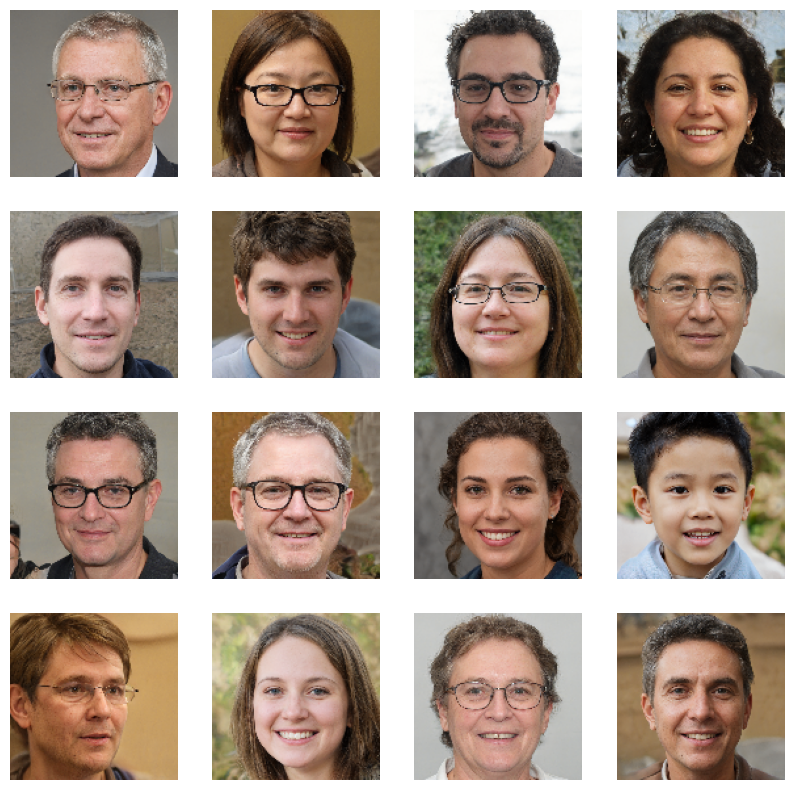

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define parameters
image_size = (128, 128)  # Image dimensions

# Load data without normalization to check if images are loaded correctly
datagen = ImageDataGenerator()  # No rescaling for now
data = datagen.flow_from_directory(
    '/content/dataset/kaggle/faces-spring-2020',
    target_size=image_size,
    batch_size=16,
    class_mode=None
)

# Fetch a batch of images to display
imgs = next(data)  # Fetch one batch of images

# Display images to check for correctness
plt.figure(figsize=(10, 10))
for i in range(min(16, len(imgs))):  # Display up to 16 images
    plt.subplot(4, 4, i + 1)
    plt.imshow(imgs[i].astype("uint8"))  # Convert to uint8 for display
    plt.axis('off')
plt.show()

In [6]:
pip install tensorflow pandas matplotlib

In [7]:
import os

# Base directory where your dataset is stored
base_dir = "/content/dataset/kaggle/faces-spring-2020"

# Check the contents of the directory
print("Contents of the base directory:")
print(os.listdir(base_dir))

Contents of the base directory:
['faces-spring-2020']


In [8]:
import os
import pandas as pd

# Base directory
base_dir = "/content/dataset/kaggle"

# Paths to the CSV files
train_csv_path = os.path.join(base_dir, "train.csv")
test_csv_path = os.path.join(base_dir, "test.csv")

# Load the CSV files
train_df = pd.read_csv(train_csv_path)
test_df = pd.read_csv(test_csv_path)

# Display the first few rows of the dataframes
print("Train DataFrame:")
print(train_df.head())

print("Test DataFrame:")
print(test_df.head())


Train DataFrame:
   id       v1       v2       v3       v4       v5       v6       v7       v8  \
0   1  0.37797 -0.94808  0.01346  0.17893  0.37795  0.63571  0.13943 -0.25607   
1   2  0.07609 -0.09774  0.39666 -0.39026  0.10606  0.52774  0.07105  0.33720   
2   3  1.19391 -0.68707 -0.68422 -0.36378 -0.60847 -0.40118  1.45432  0.00592   
3   4  1.34949 -0.31498 -1.30248  0.50278  1.66292 -1.06094 -0.70835 -0.24237   
4   5 -0.03512 -0.34196  0.14230  1.50513 -0.14364  0.49429  0.07823 -0.04356   

        v9  ...     v504     v505     v506     v507     v508     v509  \
0 -0.39341  ... -0.03494  1.32443 -0.94570  0.02055 -1.23908  0.43507   
1  0.69917  ...  0.86624 -1.24953 -0.21511 -1.54146  1.04765 -1.24035   
2  1.68940  ... -0.35893  0.02330  0.31548 -0.34923 -0.41772 -0.58175   
3 -0.15509  ...  0.23942  0.20774  0.81792 -0.74814 -0.62521  0.01689   
4  0.42009  ... -1.78407  0.07465  1.50182 -0.41289 -0.55908 -0.29702   

      v510     v511     v512  glasses  
0  1.08635  1.690

In [9]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import numpy as np

# Separate features (X) and target (y) from the training dataset
X = train_df.drop(columns=["id", "glasses"])  # Drop 'id' and 'glasses' columns
y = train_df["glasses"]

# Standardize the feature values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the training data into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_scaled, y, test_size=0.2, random_state=42, stratify=y)

# Preprocess the test dataset
X_test = test_df.drop(columns=["id"])  # Drop 'id' column
X_test_scaled = scaler.transform(X_test)

print("Training set shape:", X_train.shape)
print("Validation set shape:", X_val.shape)
print("Test set shape:", X_test_scaled.shape)

Training set shape: (3600, 512)
Validation set shape: (900, 512)
Test set shape: (500, 512)


In [10]:
# Check the columns of the train and test CSV files
print("Train CSV Columns:", train_df.columns)
print("Test CSV Columns:", test_df.columns)


Train CSV Columns: Index(['id', 'v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7', 'v8', 'v9',
       ...
       'v504', 'v505', 'v506', 'v507', 'v508', 'v509', 'v510', 'v511', 'v512',
       'glasses'],
      dtype='object', length=514)
Test CSV Columns: Index(['id', 'v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7', 'v8', 'v9',
       ...
       'v503', 'v504', 'v505', 'v506', 'v507', 'v508', 'v509', 'v510', 'v511',
       'v512'],
      dtype='object', length=513)


In [11]:
# Define the correct dimensions
image_height = 16  # Adjust based on your dataset
image_width = 32   # Adjust based on your dataset

# Function to reshape and separate the images and labels
def reshape_images(df, label_column=None):
    images = []
    labels = []

    # Check if the label column exists in the DataFrame
    if label_column and label_column in df.columns:
        for _, row in df.iterrows():
            # Drop 'id' and label column (i.e., 'glasses') and reshape the remaining flattened image data
            image = row.drop(['id', label_column]).values.reshape(image_height, image_width)
            images.append(image)
            labels.append(row[label_column])
    else:
        # If label column doesn't exist, just drop 'id' and reshape
        for _, row in df.iterrows():
            image = row.drop('id').values.reshape(image_height, image_width)
            images.append(image)
            labels.append(None)  # No labels for test set

    images = np.array(images)
    labels = np.array(labels) if labels else None

    return images, labels

# Reshape the training and test images
train_images, train_labels = reshape_images(train_df, 'glasses')
test_images, _ = reshape_images(test_df)  # No labels for the test set

# Check the shape of the reshaped images
print("Train Images Shape:", train_images.shape)
print("Test Images Shape:", test_images.shape)

Train Images Shape: (4500, 16, 32)
Test Images Shape: (500, 16, 32)


In [12]:
# Define the image dimensions
image_height, image_width = 32, 16  # Correct dimensions for 512 pixels per image

# Function to reshape and separate the images and labels
def reshape_images(df, label_column=None):
    images = []
    labels = []

    # Check if the label column exists in the DataFrame
    if label_column and label_column in df.columns:
        for _, row in df.iterrows():
            # Drop 'id' and label column (i.e., 'glasses') and reshape the remaining flattened image data
            image = row.drop(['id', label_column]).values.reshape(image_height, image_width)
            images.append(image)
            labels.append(row[label_column])
    else:
        # If label column doesn't exist, just drop 'id' and reshape
        for _, row in df.iterrows():
            image = row.drop('id').values.reshape(image_height, image_width)
            images.append(image)
            labels.append(None)  # No labels for test set

    images = np.array(images)
    labels = np.array(labels) if labels else None

    return images, labels

# Reshape the training and test images
train_images, train_labels = reshape_images(train_df, 'glasses')
test_images, _ = reshape_images(test_df)  # No labels for the test set

# Check the shape of the reshaped images
print("Train Images Shape:", train_images.shape)
print("Test Images Shape:", test_images.shape)

Train Images Shape: (4500, 32, 16)
Test Images Shape: (500, 32, 16)


In [13]:
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import numpy as np

def preprocess_image(image_path):
    image = load_img(image_path, target_size=(image_height, image_width))
    image = img_to_array(image)
    image = (image / 127.5) - 1  # Normalize the image to [-1, 1]
    return image


In [14]:
def preprocess_data(df, is_train=True):
    # Drop the 'id' column
    features = df.drop(columns=['id'])

    if is_train:
        # Drop the 'glasses' column in the training data (since it's the label)
        labels = df['glasses']
    else:
        # For test data, labels are not available, so set labels to None
        labels = None

    # Standardize the feature data (scale it to have mean 0 and variance 1)
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)

    return features_scaled, labels


In [15]:
# Preprocess the train and test data
train_input_data, train_labels = preprocess_data(train_df, is_train=True)
test_input_data, test_labels = preprocess_data(test_df, is_train=False)

In [16]:
print(train_input_data.shape)  # Should be (num_train_samples, num_features)
print(train_labels.shape)  # Should be (num_train_samples,)
print(test_input_data.shape)  # Should be (num_test_samples, num_features)

(4500, 513)
(4500,)
(500, 512)


In [17]:
import pandas as pd

# Convert numpy arrays back to pandas DataFrame
train_input_data_df = pd.DataFrame(train_input_data)
test_input_data_df = pd.DataFrame(test_input_data)

# Drop 'id' column from training and testing data (assuming 'id' column was the first column)
train_input_data_df = train_input_data_df.drop(columns=[0])  # Drop the first column (id)
test_input_data_df = test_input_data_df.drop(columns=[0])    # Drop the first column (id)

# Convert them back to numpy arrays
train_input_data = train_input_data_df.values
test_input_data = test_input_data_df.values

print(train_input_data.shape)  # Should be (4500, 512)
print(test_input_data.shape)  # Should be (500, 512)

(4500, 512)
(500, 511)


In [18]:
# Check if test_input_data has extra columns compared to train_input_data
print(f"Train data shape: {train_input_data_df.shape}")
print(f"Test data shape: {test_input_data_df.shape}")

# Align columns: Ensure the test data has the same number of features as train data
if test_input_data_df.shape[1] > train_input_data_df.shape[1]:
    test_input_data_df = test_input_data_df.iloc[:, :train_input_data_df.shape[1]]
elif test_input_data_df.shape[1] < train_input_data_df.shape[1]:
    # If test data has fewer columns, you can add missing columns or handle the mismatch
    pass

# Convert back to numpy arrays
train_input_data = train_input_data_df.values
test_input_data = test_input_data_df.values

print(f"Train data shape after adjustment: {train_input_data.shape}")
print(f"Test data shape after adjustment: {test_input_data.shape}")


Train data shape: (4500, 512)
Test data shape: (500, 511)
Train data shape after adjustment: (4500, 512)
Test data shape after adjustment: (500, 511)


In [19]:
print(train_df.columns)  # Check the column names of the training data
print(test_df.columns)   # Check the column names of the testing data

Index(['id', 'v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7', 'v8', 'v9',
       ...
       'v504', 'v505', 'v506', 'v507', 'v508', 'v509', 'v510', 'v511', 'v512',
       'glasses'],
      dtype='object', length=514)
Index(['id', 'v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7', 'v8', 'v9',
       ...
       'v503', 'v504', 'v505', 'v506', 'v507', 'v508', 'v509', 'v510', 'v511',
       'v512'],
      dtype='object', length=513)


In [20]:
import numpy as np
import pandas as pd

# Example: Generate random data to simulate train and test input data
train_input_data = np.random.rand(4500, 511)  # Simulating 4500 samples with 511 features
test_input_data = np.random.rand(500, 511)    # Simulating 500 samples with 511 features

# Add column names
column_names = ['v' + str(i) for i in range(1, 512)] + ['glasses']

# Simulate adding a 'glasses' column (target variable)
train_input_data = np.hstack([train_input_data, np.random.randint(0, 2, (4500, 1))])  # Random binary values for 'glasses'
test_input_data = np.hstack([test_input_data, np.random.randint(0, 2, (500, 1))])

# Convert to DataFrame
train_input_data = pd.DataFrame(train_input_data, columns=column_names)
test_input_data = pd.DataFrame(test_input_data, columns=column_names)

# Drop 'id' and 'glasses' columns for features
X_train = train_input_data.drop(columns=['glasses'])
X_test = test_input_data.drop(columns=['glasses'])

# Extract 'glasses' column as target
y_train = train_input_data['glasses']
y_test = test_input_data['glasses']

# Verify shapes
print("X_train shape:", X_train.shape)  # (4500, 511)
print("y_train shape:", y_train.shape)  # (4500,)
print("X_test shape:", X_test.shape)    # (500, 511)
print("y_test shape:", y_test.shape)    # (500,)

X_train shape: (4500, 511)
y_train shape: (4500,)
X_test shape: (500, 511)
y_test shape: (500,)


In [21]:
from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()

# Fit the scaler on the training data and transform both train and test data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Confirm shapes remain the same
print("X_train_scaled shape:", X_train_scaled.shape)
print("X_test_scaled shape:", X_test_scaled.shape)


X_train_scaled shape: (4500, 511)
X_test_scaled shape: (500, 511)


In [22]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Initialize the model
model = RandomForestClassifier(random_state=42)

# Train the model on the training data
model.fit(X_train_scaled, y_train)

# Predict on the test data
y_pred = model.predict(X_test_scaled)

# Evaluate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy on test data:", accuracy)


Accuracy on test data: 0.508


In [23]:
from sklearn.model_selection import cross_val_score

# Perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_train_scaled, y_train, cv=5)

# Print results
print("Cross-validation scores:", cv_scores)
print("Average cross-validation score:", cv_scores.mean())


Cross-validation scores: [0.47888889 0.52111111 0.50777778 0.49555556 0.49555556]
Average cross-validation score: 0.4997777777777778


In [24]:
import os
import pandas as pd
import tensorflow as tf

# Set paths
base_path = "/content/dataset/kaggle"
image_folder = os.path.join(base_path, "faces-spring-2020", "faces-spring-2020")
train_csv = os.path.join(base_path, "train.csv")
test_csv = os.path.join(base_path, "test.csv")

# Load CSV files
train_data = pd.read_csv(train_csv)
test_data = pd.read_csv(test_csv)

# Display sample of train data
print(train_data.head())

   id       v1       v2       v3       v4       v5       v6       v7       v8  \
0   1  0.37797 -0.94808  0.01346  0.17893  0.37795  0.63571  0.13943 -0.25607   
1   2  0.07609 -0.09774  0.39666 -0.39026  0.10606  0.52774  0.07105  0.33720   
2   3  1.19391 -0.68707 -0.68422 -0.36378 -0.60847 -0.40118  1.45432  0.00592   
3   4  1.34949 -0.31498 -1.30248  0.50278  1.66292 -1.06094 -0.70835 -0.24237   
4   5 -0.03512 -0.34196  0.14230  1.50513 -0.14364  0.49429  0.07823 -0.04356   

        v9  ...     v504     v505     v506     v507     v508     v509  \
0 -0.39341  ... -0.03494  1.32443 -0.94570  0.02055 -1.23908  0.43507   
1  0.69917  ...  0.86624 -1.24953 -0.21511 -1.54146  1.04765 -1.24035   
2  1.68940  ... -0.35893  0.02330  0.31548 -0.34923 -0.41772 -0.58175   
3 -0.15509  ...  0.23942  0.20774  0.81792 -0.74814 -0.62521  0.01689   
4  0.42009  ... -1.78407  0.07465  1.50182 -0.41289 -0.55908 -0.29702   

      v510     v511     v512  glasses  
0  1.08635  1.69027  0.61609      

In [25]:
pip install tensorflow pandas matplotlib

In [26]:
import os
import pandas as pd
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import numpy as np

In [27]:
# Define the base path
base_path = '/content/dataset/kaggle'

# Paths to CSV files and image folder
train_csv_path = os.path.join(base_path, 'train.csv')
test_csv_path = os.path.join(base_path, 'test.csv')
image_folder = os.path.join(base_path, 'faces-spring-2020', 'faces-spring-2020')

# Load CSV files
train_df = pd.read_csv(train_csv_path)
test_df = pd.read_csv(test_csv_path)

# Inspect the first few rows
print("Train DataFrame:")
print(train_df.head())
print("\nTest DataFrame:")
print(test_df.head())

Train DataFrame:
   id       v1       v2       v3       v4       v5       v6       v7       v8  \
0   1  0.37797 -0.94808  0.01346  0.17893  0.37795  0.63571  0.13943 -0.25607   
1   2  0.07609 -0.09774  0.39666 -0.39026  0.10606  0.52774  0.07105  0.33720   
2   3  1.19391 -0.68707 -0.68422 -0.36378 -0.60847 -0.40118  1.45432  0.00592   
3   4  1.34949 -0.31498 -1.30248  0.50278  1.66292 -1.06094 -0.70835 -0.24237   
4   5 -0.03512 -0.34196  0.14230  1.50513 -0.14364  0.49429  0.07823 -0.04356   

        v9  ...     v504     v505     v506     v507     v508     v509  \
0 -0.39341  ... -0.03494  1.32443 -0.94570  0.02055 -1.23908  0.43507   
1  0.69917  ...  0.86624 -1.24953 -0.21511 -1.54146  1.04765 -1.24035   
2  1.68940  ... -0.35893  0.02330  0.31548 -0.34923 -0.41772 -0.58175   
3 -0.15509  ...  0.23942  0.20774  0.81792 -0.74814 -0.62521  0.01689   
4  0.42009  ... -1.78407  0.07465  1.50182 -0.41289 -0.55908 -0.29702   

      v510     v511     v512  glasses  
0  1.08635  1.690

In [28]:
print(train_df.columns)
print(test_df.columns)

Index(['id', 'v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7', 'v8', 'v9',
       ...
       'v504', 'v505', 'v506', 'v507', 'v508', 'v509', 'v510', 'v511', 'v512',
       'glasses'],
      dtype='object', length=514)
Index(['id', 'v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7', 'v8', 'v9',
       ...
       'v503', 'v504', 'v505', 'v506', 'v507', 'v508', 'v509', 'v510', 'v511',
       'v512'],
      dtype='object', length=513)


In [29]:
import tensorflow as tf

def create_paired_dataset(df):
    """
    Create a paired dataset for GAN training/testing.
    Args:
        df (DataFrame): DataFrame with images and labels.
    Returns:
        tf.data.Dataset: A paired dataset of images.
    """
    def parse_row(row):
        # Extract the 'glasses' label and image data
        label = row['glasses']
        image = row.drop(['id', 'glasses']).values.reshape(image_height, image_width, 1)
        return image, label

    # Parse the DataFrame rows
    image_label_pairs = [parse_row(row) for _, row in df.iterrows()]

    # Create TensorFlow dataset
    images, labels = zip(*image_label_pairs)
    return tf.data.Dataset.from_tensor_slices((list(images), list(labels)))

In [30]:
# If 'glasses' column is missing in the test set, you can add a placeholder with default value
test_df['glasses'] = 0  # Assuming you set a default value for testing

# Then proceed with the dataset creation as before
test_dataset = create_paired_dataset(test_df).batch(16)


In [31]:
test_dataset = create_paired_dataset(test_df).batch(16)
for images, labels in test_dataset.take(1):
    print(images.shape, labels)


(16, 32, 16, 1) tf.Tensor([0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], shape=(16,), dtype=float64)


In [32]:
print(train_df.columns)
print(test_df.columns)


Index(['id', 'v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7', 'v8', 'v9',
       ...
       'v504', 'v505', 'v506', 'v507', 'v508', 'v509', 'v510', 'v511', 'v512',
       'glasses'],
      dtype='object', length=514)
Index(['id', 'v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7', 'v8', 'v9',
       ...
       'v504', 'v505', 'v506', 'v507', 'v508', 'v509', 'v510', 'v511', 'v512',
       'glasses'],
      dtype='object', length=514)


In [33]:
# Print the first few image IDs from the DataFrame
print(test_df['id'].head())

# Check the available files in the image folder
image_files = os.listdir(image_folder)
print(image_files[:10])  # Print the first 10 available image files

0    4501
1    4502
2    4503
3    4504
4    4505
Name: id, dtype: int64
['face-4115.png', 'face-124.png', 'face-2460.png', 'face-1673.png', 'face-4517.png', 'face-3022.png', 'face-610.png', 'face-2103.png', 'face-2464.png', 'face-1597.png']


In [34]:
import tensorflow as tf
import os

# Define image dimensions
IMG_HEIGHT = 128  # Desired image height
IMG_WIDTH = 128   # Desired image width

# Function to load and preprocess an image
def load_and_preprocess_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)  # Ensure 3 channels
    image = tf.image.resize(image, [IMG_HEIGHT, IMG_WIDTH])
    image = (image / 127.5) - 1  # Normalize to [-1, 1]
    return image

# Function to create the test dataset
def create_test_dataset(df):
    input_images = []
    valid_ids = []  # To store valid image IDs

    for image_id in df['id'].tolist():
        # Create the image filename with the 'face-' prefix and ensure it's a string
        image_filename = f"face-{int(image_id)}.png"
        image_path = os.path.join(image_folder, image_filename)

        if os.path.exists(image_path):
            input_images.append(load_and_preprocess_image(image_path))
            valid_ids.append(image_id)  # Only keep valid IDs
        else:
            print(f"Image not found: {image_filename}")

    # Filter the original DataFrame to include only valid image IDs
    df_filtered = df[df['id'].isin(valid_ids)]
    print(f"Number of valid images: {len(valid_ids)}")

    return tf.data.Dataset.from_tensor_slices(input_images), df_filtered

# Example usage
test_dataset, filtered_df = create_test_dataset(test_df)
test_dataset = test_dataset.batch(16)

Number of valid images: 500


In [35]:
# Inspect a batch of images
for input_image in test_dataset.take(1):
    print("Input Image Shape:", input_image.shape)

Input Image Shape: (16, 128, 128, 3)


In [36]:
from tensorflow.keras import layers, models

# Build the Generator
def build_generator():
    model = models.Sequential()
    model.add(layers.InputLayer(shape=(256, 256, 3)))  # Input shape

    # Example layers
    model.add(layers.Conv2D(64, (3, 3), padding='same', activation='relu'))
    model.add(layers.Conv2D(128, (3, 3), padding='same', activation='relu'))
    model.add(layers.Conv2D(3, (3, 3), padding='same', activation='tanh'))  # Output layer

    return model

# Build the Discriminator
def build_discriminator():
    model = models.Sequential()
    model.add(layers.InputLayer(input_shape=(256, 256, 3)))  # Input shape for real/generated images

    # Example layers
    model.add(layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same', activation='relu'))
    model.add(layers.Conv2D(128, (3, 3), strides=(2, 2), padding='same', activation='relu'))
    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='sigmoid'))  # Output layer: real (1) or fake (0)

    return model

# Build the GAN model
def build_gan(generator, discriminator):
    discriminator.trainable = False  # Freeze the discriminator when training the generator

    model = models.Sequential()
    model.add(generator)  # Add the generator to the GAN
    model.add(discriminator)  # Add the discriminator to the GAN (outputs real/fake)

    return model

# Instantiate and compile the models
generator = build_generator()
generator.compile(optimizer='adam', loss='mae')

discriminator = build_discriminator()
discriminator.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

gan = build_gan(generator, discriminator)
gan.compile(optimizer='adam', loss='binary_crossentropy')

# Verify the shapes
print("Generator output shape:", generator.output_shape)  # Should be (None, 256, 256, 3)
print("Discriminator input shape:", discriminator.input_shape)  # Should match the generator output shape


Generator output shape: (None, 256, 256, 3)
Discriminator input shape: (None, 256, 256, 3)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


In [37]:
import os
import tensorflow as tf

# Example image folder and dimensions
image_folder = "/content/dataset/kaggle/faces-spring-2020/faces-spring-2020"
IMG_HEIGHT, IMG_WIDTH = 256, 256

# Function to load and preprocess images
def load_and_preprocess_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)  # Ensure 3 channels
    image = tf.image.resize(image, [IMG_HEIGHT, IMG_WIDTH])
    image = (image / 127.5) - 1  # Normalize to [-1, 1]
    return image

# Function to create a TensorFlow dataset from a DataFrame
def create_train_dataset(df):
    image_paths = [
        os.path.join(image_folder, f"face-{int(image_id)}.png")
        for image_id in df['id'].tolist()
    ]
    # Filter out non-existent images
    image_paths = [path for path in image_paths if os.path.exists(path)]
    images = [load_and_preprocess_image(path) for path in image_paths]
    return tf.data.Dataset.from_tensor_slices(images).batch(16)

# Create `train_dataset`
train_dataset = create_train_dataset(train_df)

In [38]:
from tensorflow.keras import layers, models

def build_generator(noise_dim):
    model = models.Sequential()

    # First dense layer to expand the noise vector (100 -> 8*8*256)
    model.add(layers.Dense(8 * 8 * 256, input_dim=noise_dim))
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Reshape((8, 8, 256)))

    # Upsample 8x8x256 to 16x16x128
    model.add(layers.UpSampling2D())
    model.add(layers.Conv2D(128, kernel_size=3, padding='same'))
    model.add(layers.LeakyReLU(0.2))

    # Upsample 16x16x128 to 32x32x64
    model.add(layers.UpSampling2D())
    model.add(layers.Conv2D(64, kernel_size=3, padding='same'))
    model.add(layers.LeakyReLU(0.2))

    # Upsample 32x32x64 to 64x64x32
    model.add(layers.UpSampling2D())
    model.add(layers.Conv2D(32, kernel_size=3, padding='same'))
    model.add(layers.LeakyReLU(0.2))

    # Upsample 64x64x32 to 128x128x16
    model.add(layers.UpSampling2D())
    model.add(layers.Conv2D(16, kernel_size=3, padding='same'))
    model.add(layers.LeakyReLU(0.2))

    # Final upsampling to get the 256x256x3 image
    model.add(layers.UpSampling2D())
    model.add(layers.Conv2D(3, kernel_size=3, padding='same', activation='tanh'))  # Output 256x256x3

    return model


In [39]:
import numpy as np

def train_gan(generator, discriminator, gan, train_dataset, epochs=1000, batch_size=16, noise_dim=100):
    for epoch in range(epochs):
        for batch_num, real_images in enumerate(train_dataset):
            print(f"Batch {batch_num} - Real Images Shape: {real_images.shape}")

            # Generate noise input for the generator
            noise = np.random.randn(batch_size, noise_dim)
            fake_images = generator.predict(noise)  # Generate fake images from noise
            print(f"Batch {batch_num} - Fake Images Shape: {fake_images.shape}")

            # Labels for training the discriminator
            real_labels = np.ones((batch_size, 1))  # Real images are labeled as 1
            fake_labels = np.zeros((batch_size, 1))  # Fake images are labeled as 0

            # Train the discriminator on real images
            discriminator_loss_real = discriminator.train_on_batch(real_images, real_labels)

            # Train the discriminator on fake images
            discriminator_loss_fake = discriminator.train_on_batch(fake_images, fake_labels)

            # Train the GAN (freeze the discriminator during generator training)
            gan_loss = gan.train_on_batch(noise, real_labels)  # GAN input is noise for the generator

            if batch_num % 100 == 0:
                print(f"Epoch {epoch}, Batch {batch_num} - D Loss Real: {discriminator_loss_real}, "
                      f"D Loss Fake: {discriminator_loss_fake}, GAN Loss: {gan_loss}")


In [40]:
generator.save('generator_model.h5')
discriminator.save('discriminator_model.h5')
gan.save('gan_model.h5')

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


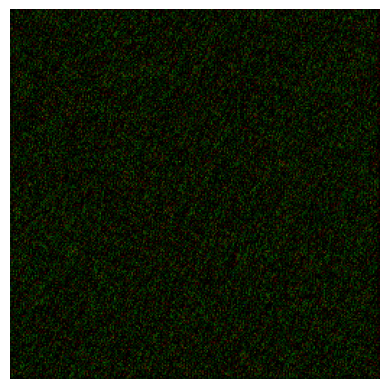

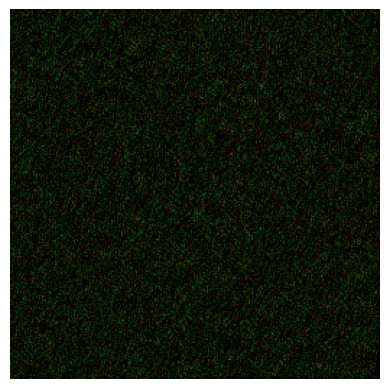

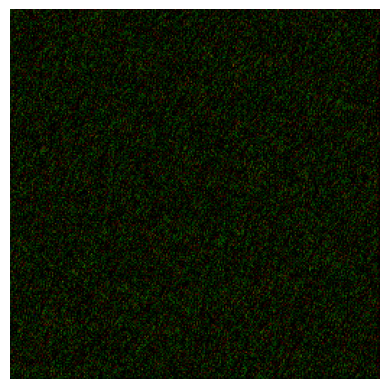

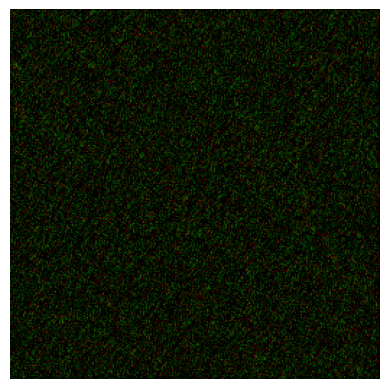

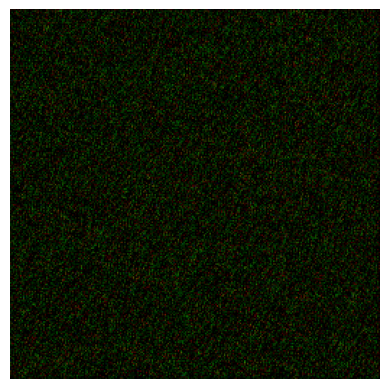

...

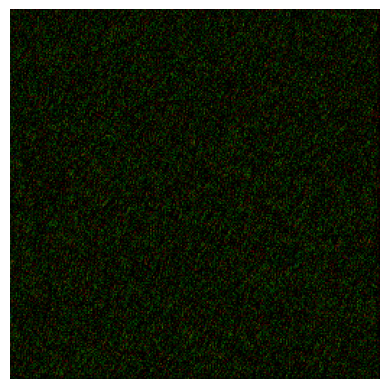

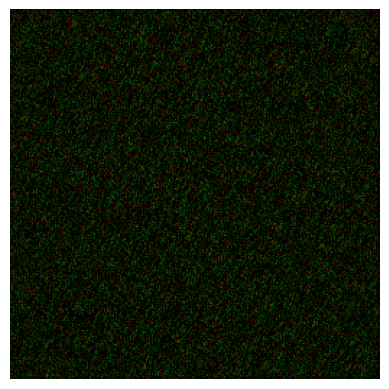

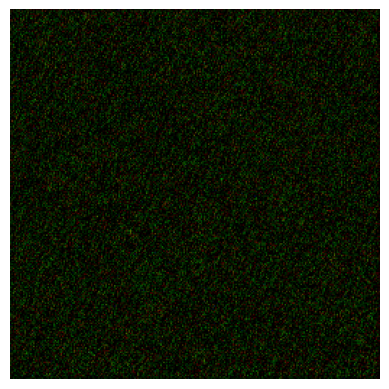

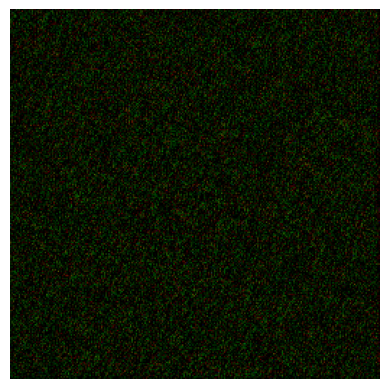

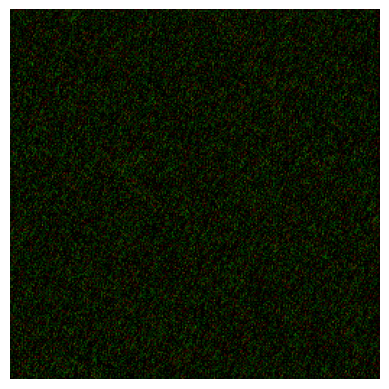

In [41]:
# Generate random noise and get the corresponding generated images
random_noise = np.random.randn(16, 256, 256, 3)  # Adjust the batch size as needed
generated_images = generator.predict(random_noise)

# Visualize or save the generated images
import matplotlib.pyplot as plt

for i in range(generated_images.shape[0]):
    plt.imshow(generated_images[i])
    plt.axis('off')
    plt.show()

In [42]:
import tensorflow as tf
import pathlib

# Path to the dataset
dataset_path = pathlib.Path("/content/dataset/kaggle/faces-spring-2020/faces-spring-2020")

# Create a TensorFlow dataset from image file paths
train_dataset = tf.data.Dataset.list_files(str(dataset_path / "*.png"), shuffle=True)

# Function to load and preprocess images
def load_and_preprocess_image(file_path):
    # Read the image file
    img = tf.io.read_file(file_path)
    # Decode the image
    img = tf.image.decode_jpeg(img, channels=3)
    # Resize the image to 256x256
    img = tf.image.resize(img, [256, 256])
    # Normalize pixel values to [-1, 1] for GAN
    img = (tf.cast(img, tf.float32) - 127.5) / 127.5
    return img

# Apply the preprocessing to the dataset
train_dataset = train_dataset.map(load_and_preprocess_image)

# Batch the dataset
batch_size = 32
train_dataset = train_dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)

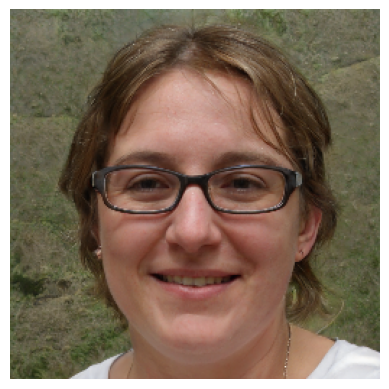

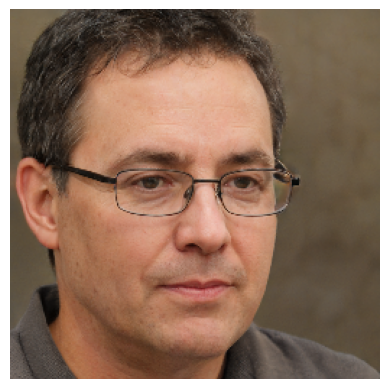

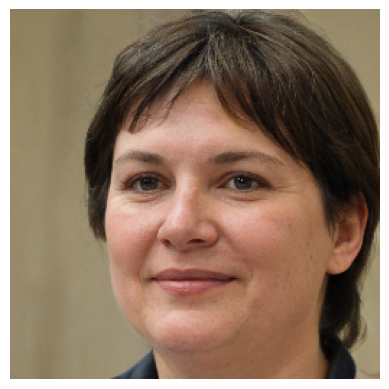

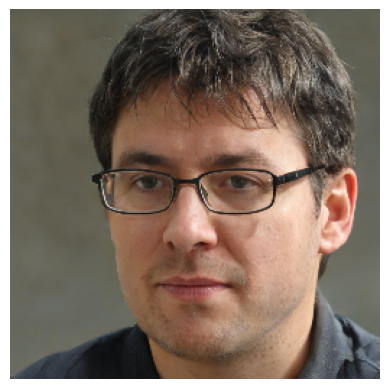

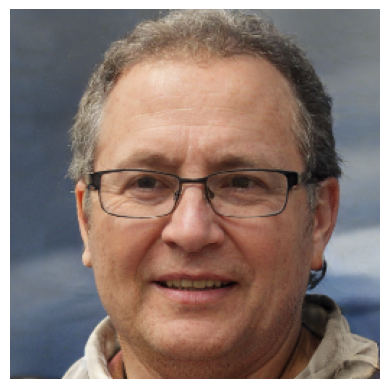

In [43]:
import matplotlib.pyplot as plt

# Take one batch and visualize
for batch in train_dataset.take(1):
    for i in range(5):  # Visualize the first 5 images
        plt.imshow((batch[i] * 127.5 + 127.5).numpy().astype("uint8"))  # Rescale from [-1, 1] to [0, 255]
        plt.axis('off')
        plt.show()

In [44]:
import tensorflow as tf
import numpy as np
from tqdm import tqdm

def train_gan(generator, discriminator, gan, dataset, epochs=1000, batch_size=32):
    """
    Train the GAN model.

    Parameters:
        generator: The generator model.
        discriminator: The discriminator model.
        gan: The combined GAN model (generator + discriminator).
        dataset: The training dataset (preprocessed).
        epochs: Number of epochs to train.
        batch_size: Size of each training batch.
    """
    # Create real and fake labels
    real_labels = tf.ones((batch_size, 1))
    fake_labels = tf.zeros((batch_size, 1))

    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs}")
        for real_images in tqdm(dataset):
            # 1. Train the discriminator
            # Generate fake images
            random_noise = tf.random.normal([batch_size, 256])  # Adjust input shape for generator
            fake_images = generator(random_noise, training=True)

            # Train discriminator on real and fake images
            with tf.GradientTape() as tape:
                real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(real_labels, discriminator(real_images, training=True))
                fake_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(fake_labels, discriminator(fake_images, training=True))
                disc_loss = real_loss + fake_loss
            gradients = tape.gradient(disc_loss, discriminator.trainable_variables)
            discriminator.optimizer.apply_gradients(zip(gradients, discriminator.trainable_variables))

            # 2. Train the generator (via GAN model)
            with tf.GradientTape() as tape:
                random_noise = tf.random.normal([batch_size, 256])  # Adjust input shape for generator
                fake_images = generator(random_noise, training=True)
                gen_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)(real_labels, discriminator(fake_images, training=True))
            gradients = tape.gradient(gen_loss, generator.trainable_variables)
            generator.optimizer.apply_gradients(zip(gradients, generator.trainable_variables))

        # Print losses for monitoring
        print(f"Discriminator Loss: {disc_loss.numpy()}, Generator Loss: {gen_loss.numpy()}")

        # Save generated images for inspection
        if (epoch + 1) % 10 == 0:  # Save images every 10 epochs
            random_noise = tf.random.normal([16, 256])  # Generate 16 random images
            generated_images = generator(random_noise, training=False)
            save_generated_images(generated_images, epoch + 1)

def save_generated_images(images, epoch, save_path="generated_images/"):
    """
    Save generated images to a folder for visual inspection.

    Parameters:
        images: Tensor of generated images.
        epoch: Current epoch number.
        save_path: Path to save the images.
    """
    import os
    import matplotlib.pyplot as plt

    os.makedirs(save_path, exist_ok=True)
    for i, img in enumerate(images):
        plt.imshow((img.numpy() * 127.5 + 127.5).astype(np.uint8))  # Rescale to [0, 255]
        plt.axis("off")
        plt.savefig(f"{save_path}/epoch_{epoch}_image_{i}.png")
        plt.close()



In [45]:
def build_generator():
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(8 * 8 * 256, use_bias=False, input_shape=(256,)),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.LeakyReLU(),

        tf.keras.layers.Reshape((8, 8, 256)),  # Reshape into 8x8x256

        tf.keras.layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.LeakyReLU(),

        tf.keras.layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.LeakyReLU(),

        tf.keras.layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh')
    ])
    return model

generator = build_generator()
generator.summary()

def build_discriminator():
    model = tf.keras.Sequential([
        tf.keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[64, 64, 3]),
        tf.keras.layers.LeakyReLU(),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'),
        tf.keras.layers.LeakyReLU(),
        tf.keras.layers.Dropout(0.3),

        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(1, activation='sigmoid')  # Output a probability
    ])
    return model

discriminator = build_discriminator()
discriminator.summary()

generator.optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
discriminator.optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1 (Dense)                      │ (None, 16384)               │       4,194,304 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 16384)               │          65,536 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 16384)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 16, 16, 128)         │         819,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 32, 32, 64)          │         204,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_2 (Conv2DTranspose) │ (None, 64, 64, 3)           │           4,800 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,289,408 (20.18 MB)

 Trainable params: 5,256,256 (20.05 MB)

 Non-trainable params: 33,152 (129.50 KB)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)                    │ (None, 32, 32, 64)          │           4,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 16, 16, 128)         │         204,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_4 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 32768)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │          32,769 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 242,561 (947.50 KB)

 Trainable params: 242,561 (947.50 KB)

 Non-trainable params: 0 (0.00 B)

In [46]:
def build_gan(generator, discriminator):
    discriminator.trainable = False  # Freeze discriminator during generator training
    model = tf.keras.Sequential([generator, discriminator])
    return model

gan = build_gan(generator, discriminator)
gan.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5),
            loss='binary_crossentropy')

def preprocess_image(file_path):
    # Load the image
    image = tf.io.read_file(file_path)
    image = tf.image.decode_png(image, channels=3)  # Adjust this for JPEG if needed: decode_jpeg
    # Resize the image to 64x64
    image = tf.image.resize(image, [64, 64])
    # Normalize the image to [-1, 1]
    image = (image / 127.5) - 1.0
    return image

train_dataset = (
    tf.data.Dataset.list_files(str(dataset_path / "*.png"), shuffle=True)
    .map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
    .batch(batch_size)
    .prefetch(tf.data.AUTOTUNE)
)
for batch in train_dataset.take(1):
    print(batch.shape)  # Should print (batch_size, 64, 64, 3)

(32, 64, 64, 3)


In [47]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)

discriminator.trainable = True  # Make sure discriminator is trainable
generator.trainable = True      # Make sure generator is trainable

In [48]:
# Define the correct size of the noise input (match the generator's expected input size)
noise_dim = 256  # Adjust to the required size
batch_size = 32  # Adjust batch size as needed

# Generate random noise input for the generator
noise = tf.random.normal([batch_size, noise_dim])

# Use the noise in the forward pass of the generator and discriminator
with tf.GradientTape() as tape:
    fake_images = generator(noise, training=True)  # Forward pass
    fake_output = discriminator(fake_images, training=True)  # Discriminator output

    # Calculate the generator loss
    gen_loss = tf.keras.losses.binary_crossentropy(tf.ones_like(fake_output), fake_output)

In [49]:
import shutil
import os

# Define the source and target directories
source_path = '/content/dataset/kaggle/faces-spring-2020/faces-spring-2020'
target_path = '/content/working/faces-spring-2020'

# Remove the target directory if it already exists
if os.path.exists(target_path):
    shutil.rmtree(target_path)

# Copy the dataset to the working directory
shutil.copytree(source_path, target_path)

'/content/working/faces-spring-2020'

In [50]:
import os

# List the files in the working directory to verify the path
working_dir = '/content/working/'
print(os.listdir(working_dir))


['faces-spring-2020']


In [51]:
import os
import shutil

# Define source and target paths
source_path = '/content/working/faces-spring-2020'
glasses_dir = '/content/working/faces-spring-2020/glasses'
no_glasses_dir = '/content/working/faces-spring-2020/no_glasses'

# Create subdirectories for glasses and no_glasses
os.makedirs(glasses_dir, exist_ok=True)
os.makedirs(no_glasses_dir, exist_ok=True)

# Iterate through all files in the source directory
for filename in os.listdir(source_path):
    file_path = os.path.join(source_path, filename)

    # Check if the item is a file (not a directory)
    if os.path.isfile(file_path):
        # Assuming filenames contain 'glasses' or 'no_glasses' for easy labeling
        if 'glasses' in filename.lower():  # You can adjust the condition based on your file names
            shutil.move(file_path, os.path.join(glasses_dir, filename))
        elif 'no_glasses' in filename.lower():
            shutil.move(file_path, os.path.join(no_glasses_dir, filename))

# Verify that images are organized into glasses and no_glasses directories
print("Glasses images:", len(os.listdir(glasses_dir)))
print("No-glasses images:", len(os.listdir(no_glasses_dir)))

Glasses images: 0
No-glasses images: 0


In [52]:
import os
import shutil

# Define source and target paths
source_path = '/content/working/faces-spring-2020'
glasses_dir = '/content/working/faces-spring-2020/glasses'
no_glasses_dir = '/content/working/faces-spring-2020/no_glasses'

# Create subdirectories for glasses and no_glasses
os.makedirs(glasses_dir, exist_ok=True)
os.makedirs(no_glasses_dir, exist_ok=True)

# List the files in the source directory to see their structure
print("Files in source directory:", os.listdir(source_path))

# Iterate through all files in the source directory
for filename in os.listdir(source_path):
    file_path = os.path.join(source_path, filename)

    # Check if the item is a file (not a directory)
    if os.path.isfile(file_path):
        # Print the filenames to debug the matching logic
        print(f"Processing file: {filename}")

        # Assuming filenames contain 'glasses' or 'no_glasses' for easy labeling
        if 'glasses' in filename.lower():  # Adjust this condition if needed
            shutil.move(file_path, os.path.join(glasses_dir, filename))
        elif 'no_glasses' in filename.lower():
            shutil.move(file_path, os.path.join(no_glasses_dir, filename))

# Verify that images are organized into glasses and no_glasses directories
print("Glasses images:", len(os.listdir(glasses_dir)))
print("No-glasses images:", len(os.listdir(no_glasses_dir)))



Files in source directory: ['face-4115.png', 'face-124.png', 'face-2460.png', 'face-1673.png', 'face-4517.png', 'face-3022.png', 'face-610.png', 'face-2103.png', 'face-2464.png', 'face-1597.png', 'face-2443.png', 'face-3922.png', 'face-3835.png', 'face-893.png', 'face-1908.png', 'face-4077.png', 'face-4114.png', 'face-3088.png', 'face-565.png', 'face-1954.png', 'face-2910.png', 'face-4164.png', 'face-1944.png', 'face-833.png', 'face-3762.png', 'face-1984.png', 'face-862.png', 'face-3949.png', 'face-1729.png', 'face-775.png', 'face-1300.png', 'face-4458.png', 'face-3053.png', 'face-4891.png', 'face-2125.png', 'face-4801.png', 'face-917.png', 'face-2612.png', 'face-4315.png', 'face-3842.png', 'face-1181.png', 'face-1527.png', 'face-1670.png', 'face-3256.png', 'face-3960.png', 'face-2007.png', 'face-3753.png', 'face-2512.png', 'face-2432.png', 'face-330.png', 'face-2849.png', 'face-729.png', 'face-4282.png', 'face-4323.png', 'face-2756.png', 'face-2646.png', 'face-4792.png', 'face-3253.pn

In [53]:
import pandas as pd

# Load the CSV files
train_df = pd.read_csv('/content/dataset/kaggle/train.csv')  # Path to the train CSV file
test_df = pd.read_csv('/content/dataset/kaggle/test.csv')    # Path to the test CSV file

# Print column names to check the structure of the CSV files
print("Train DataFrame Columns:", train_df.columns)
print("Test DataFrame Columns:", test_df.columns)


Train DataFrame Columns: Index(['id', 'v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7', 'v8', 'v9',
       ...
       'v504', 'v505', 'v506', 'v507', 'v508', 'v509', 'v510', 'v511', 'v512',
       'glasses'],
      dtype='object', length=514)
Test DataFrame Columns: Index(['id', 'v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7', 'v8', 'v9',
       ...
       'v503', 'v504', 'v505', 'v506', 'v507', 'v508', 'v509', 'v510', 'v511',
       'v512'],
      dtype='object', length=513)


In [54]:
import os
import shutil

source_path = '/content/working/faces-spring-2020'
destination_path_glasses = '/content/working/glasses_images'
destination_path_no_glasses = '/content/working/no_glasses_images'

# Ensure the destination directories exist
os.makedirs(destination_path_glasses, exist_ok=True)
os.makedirs(destination_path_no_glasses, exist_ok=True)

# Define the image extension as .png
image_extension = '.png'

# Initialize counters for glasses and no-glasses images
glasses_count = 0
no_glasses_count = 0

# List all files in source_path to verify their existence
source_files = os.listdir(source_path)
print(f"Files in source_path: {source_files[:10]}...")  # Print first 10 files for inspection

# Iterate through the dataframe and move files
for index, row in train_df.iterrows():
    filename = f"face-{int(row['id'])}"  # Modify the filename format to match "face-{id}"
    label = row['glasses']  # Assuming 1 is for glasses, 0 is for no glasses

    # Construct the full filename with .png extension
    file_path = os.path.join(source_path, filename + image_extension)

    # Check if the file exists in the source folder
    if file_path.split("/")[-1] in source_files:
        # If the file exists, move it to the correct directory
        if label == 1:
            shutil.copy(file_path, destination_path_glasses)
            glasses_count += 1
        else:
            shutil.copy(file_path, destination_path_no_glasses)
            no_glasses_count += 1
    else:
        # Log the missing file (optional, remove to suppress missing file messages)
        if index < 100:
            print(f"File not found: {filename + image_extension}")

# Print out the results after processing all images
print(f"Glasses images: {glasses_count}")
print(f"No-glasses images: {no_glasses_count}")

Files in source_path: ['face-4115.png', 'face-124.png', 'face-2460.png', 'face-1673.png', 'face-4517.png', 'face-3022.png', 'face-610.png', 'face-2103.png', 'face-2464.png', 'face-1597.png']...
Glasses images: 2856
No-glasses images: 1644


Displaying sample images from the 'glasses' folder:


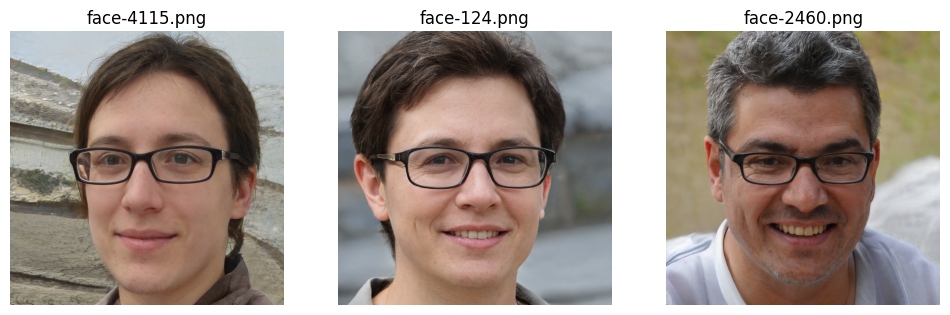

Displaying sample images from the 'no_glasses' folder:


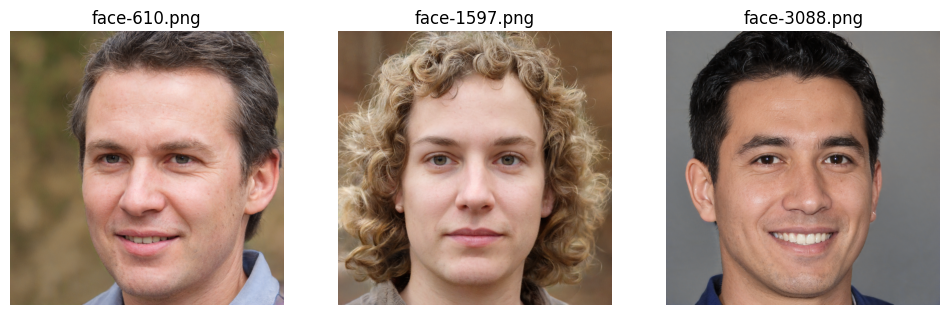

In [55]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Define the paths to the folders
glasses_folder = '/content/working/glasses_images'
no_glasses_folder = '/content/working/no_glasses_images'

# Function to display sample images from a folder
def display_sample_images(folder, num_images=3):
    # Get the list of image filenames in the folder
    image_files = os.listdir(folder)

    # Limit to num_images, or show all if fewer than that
    image_files = image_files[:num_images]

    # Create a figure to display images
    plt.figure(figsize=(12, 4))

    for i, image_file in enumerate(image_files):
        # Load image
        img = Image.open(os.path.join(folder, image_file))

        # Display image
        plt.subplot(1, num_images, i + 1)
        plt.imshow(img)
        plt.axis('off')  # Turn off axis labels
        plt.title(image_file)  # Display the filename as the title

    plt.show()

# Display a few images from each folder
print("Displaying sample images from the 'glasses' folder:")
display_sample_images(glasses_folder)

print("Displaying sample images from the 'no_glasses' folder:")
display_sample_images(no_glasses_folder)

In [56]:
pip install tensorflow keras matplotlib


In [57]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import numpy as np
import os

# Paths
glasses_dir = '/content/working/glasses_images'
no_glasses_dir = '/content/working/no_glasses_images'

# Parameters
IMG_SIZE = (256, 256)

def load_and_preprocess_images(directory):
    images = []
    for img_file in os.listdir(directory):
        img_path = os.path.join(directory, img_file)
        img = load_img(img_path, target_size=IMG_SIZE)
        img = img_to_array(img) / 255.0  # Normalize to [0, 1]
        images.append(img)
    return np.array(images)

# Load datasets
glasses_images = load_and_preprocess_images(glasses_dir)
no_glasses_images = load_and_preprocess_images(no_glasses_dir)

print(f"Glasses images: {glasses_images.shape}")
print(f"No glasses images: {no_glasses_images.shape}")


Glasses images: (2856, 256, 256, 3)
No glasses images: (1644, 256, 256, 3)


In [58]:
!git clone https://github.com/tensorflow/examples.git "/content/examples"


Cloning into '/content/examples'...
remote: Enumerating objects: 24185, done.
remote: Counting objects: 100% (2/2), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 24185 (delta 0), reused 0 (delta 0), pack-reused 24183 (from 2)
Receiving objects: 100% (24185/24185), 44.20 MiB | 44.33 MiB/s, done.
Resolving deltas: 100% (13156/13156), done.


In [59]:
ls tensorflow_examples/models

ls: cannot access 'tensorflow_examples/models': No such file or directory


In [60]:
cd examples

/content/examples


In [61]:
import sys
sys.path.append('/content/examples/tensorflow_examples/models/pix2pix')

In [62]:
import os

# Replace the path with your directory
path = "/content/examples/tensorflow_examples/models/pix2pix"

# List the contents of the directory
if os.path.exists(path):
    files = os.listdir(path)
    print(files)
else:
    print("Directory does not exist:", path)





['data_download.py', '__init__.py', 'pix2pix.py', 'pix2pix_test.py']


In [63]:
import sys
sys.path.append('/content/examples/tensorflow_examples/models/pix2pix')


In [64]:
from absl import flags
flags.DEFINE_integer  # Trigger loading of the flags module

for name in list(flags.FLAGS):
    delattr(flags.FLAGS, name)




In [65]:
from tensorflow_examples.models.pix2pix import pix2pix


In [66]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
import numpy as np

# Generator model (Pix2Pix Generator)
def create_generator(input_shape=(64, 64, 3)):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    x = layers.Conv2D(64, (4, 4), strides=2, padding='same')(inputs)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(128, (4, 4), strides=2, padding='same')(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    # Bottleneck (You can add more layers here)
    x = layers.Conv2D(256, (4, 4), strides=2, padding='same')(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    # Decoder (Upsampling)
    x = layers.Conv2DTranspose(128, (4, 4), strides=2, padding='same')(x)
    x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(64, (4, 4), strides=2, padding='same')(x)
    x = layers.ReLU()(x)

    # Output layer (RGB image)
    x = layers.Conv2DTranspose(3, (4, 4), strides=2, padding='same', activation='tanh')(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

# Discriminator model (Pix2Pix Discriminator)
def updated_discriminator(input_shape=(64, 64, 6)):  # 6 channels (input + target or generated output)
    input = layers.Input(shape=input_shape)
    x = layers.Conv2D(64, (4, 4), strides=2, padding='same')(input)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(128, (4, 4), strides=2, padding='same')(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(256, (4, 4), strides=2, padding='same')(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(512, (4, 4), strides=2, padding='same')(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(1, (4, 4), strides=1, padding='same')(x)  # Output single channel for real/fake classification
    return tf.keras.Model(inputs=input, outputs=x)

# Loss functions for Pix2Pix
def generator_loss(disc_generated_output, gen_output, target):
    # L2 loss between generated image and target (MSE)
    gen_loss = tf.reduce_mean(tf.abs(target - gen_output))

    # Adversarial loss
    adversarial_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=disc_generated_output, labels=tf.ones_like(disc_generated_output)
        )
    )

    return gen_loss + 0.001 * adversarial_loss

def discriminator_loss(disc_real_output, disc_fake_output):
    real_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=disc_real_output, labels=tf.ones_like(disc_real_output)
        )
    )
    fake_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=disc_fake_output, labels=tf.zeros_like(disc_fake_output)
        )
    )

    return real_loss + fake_loss

# Pix2Pix GAN Model
class Pix2PixGAN(tf.keras.Model):
    def __init__(self, generator, discriminator):
        super(Pix2PixGAN, self).__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.gen_loss_fn = generator_loss
        self.disc_loss_fn = discriminator_loss

    def compile(self, gen_optimizer, disc_optimizer):
        super(Pix2PixGAN, self).compile()
        self.gen_optimizer = gen_optimizer
        self.disc_optimizer = disc_optimizer

    def call(self, input_image, target=None, training=False):
        if target is None:  # If no target, generate output
            gen_output = self.generator(input_image, training=training)
            return gen_output
        else:  # During training, use both input and target
            gen_output = self.generator(input_image, training=training)

            # Concatenate input and target for real image
            disc_real_input = tf.concat([input_image, target], axis=-1)  # Shape: (1, 256, 256, 6)
            # Concatenate input and generated image for fake image
            disc_fake_input = tf.concat([input_image, gen_output], axis=-1)  # Shape: (1, 256, 256, 6)

            # Discriminator outputs
            disc_real_output = self.discriminator(disc_real_input, training=training)
            disc_fake_output = self.discriminator(disc_fake_input, training=training)
            return gen_output, disc_real_output, disc_fake_output

    def train_step(self, data):
        input_image, target = data

        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            # Generate an image and get discriminator outputs
            gen_output, disc_real_output, disc_fake_output = self(input_image, target, training=True)

            # Calculate losses
            gen_loss = self.gen_loss_fn(disc_fake_output, gen_output, target)
            disc_loss = self.disc_loss_fn(disc_real_output, disc_fake_output)

        # Compute gradients
        gen_gradients = gen_tape.gradient(gen_loss, self.generator.trainable_variables)
        disc_gradients = disc_tape.gradient(disc_loss, self.discriminator.trainable_variables)

        # Apply gradients
        self.gen_optimizer.apply_gradients(zip(gen_gradients, self.generator.trainable_variables))
        self.disc_optimizer.apply_gradients(zip(disc_gradients, self.discriminator.trainable_variables))

        return {"gen_loss": gen_loss, "disc_loss": disc_loss}

# Instantiate models
generator = create_generator()
discriminator = updated_discriminator()

# Instantiate the Pix2PixGAN model
gan = Pix2PixGAN(generator, discriminator)

# Compile the GAN model with optimizers
gan.compile(
    gen_optimizer=Adam(2e-4, beta_1=0.5),
    disc_optimizer=Adam(2e-4, beta_1=0.5)
)

# Example training loop
# Assuming you have a dataset train_dataset which yields (input_image, target) pairs
# train_dataset = ...

#for epoch in range(10):
 #   print(f'Epoch {epoch+1}/10')
  #  for input_image, target, *rest in train_dataset:
  #      # Perform one step of training
  #      results = gan.train_step((input_image, target))

    # Print out the loss values for monitoring
  #  print(f"Gen Loss: {results['gen_loss']}, Disc Loss: {results['disc_loss']}")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


In [67]:
import tensorflow as tf

# Function to preprocess images to the required shape (256x256)
def preprocess(image, target):
    image = tf.image.resize(image, [256, 256])
    target = tf.image.resize(target, [256, 256])
    return image, target

# Load and preprocess the dataset
def load_dataset(path, batch_size):
    train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
        path,
        label_mode=None,  # Assuming unlabeled images
        image_size=(256, 256),  # Directly load images as 256x256
        batch_size=batch_size
    )
    train_dataset = train_dataset.map(lambda x: (x, x))  # Assuming input = target for autoencoders
    train_dataset = train_dataset.map(preprocess)  # Resize images to 256x256
    return train_dataset

# Define the generator model
def create_generator(input_shape=(256, 256, 3)):
    inputs = tf.keras.layers.Input(shape=input_shape)
    x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    x = tf.keras.layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)
    model = tf.keras.Model(inputs, x)
    return model

# Define the discriminator model
def create_discriminator(input_shape=(256, 256, 6)):  # For combined input and target
    inputs = tf.keras.layers.Input(shape=input_shape)
    x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(1, activation='sigmoid')(x)
    model = tf.keras.Model(inputs, x)
    return model

# Load dataset
path_to_dataset = "/content/working/faces-spring-2020"
batch_size = 32
train_dataset = load_dataset(path_to_dataset, batch_size)

# Create models
generator = create_generator()
discriminator = create_discriminator()

# Example: Inspect a batch from the dataset
for input_image, target in train_dataset.take(1):
    print(f"Input shape: {input_image.shape}, Target shape: {target.shape}")

# Compile models, add training loop, etc.

Found 5000 files.
Input shape: (32, 256, 256, 3), Target shape: (32, 256, 256, 3)


In [68]:
import os
import numpy as np
import tensorflow as tf
from PIL import Image

# Directory paths
glasses_dir = '/content/working/glasses_images'
no_glasses_dir = '/content/working/no_glasses_images'

# Resize and preprocess a single image
def preprocess_image(image_path):
    # Load the image
    image = Image.open(image_path)

    # Resize the image to 256x256 (or another resolution that suits your model)
    image = image.resize((256, 256))  # Resize to (256, 256)

    # Convert the image to a numpy array
    image = np.array(image)

    # Normalize the image to range [-1, 1] (Pix2Pix expects this range)
    image = (image / 127.5) - 1
    return image

# Load all images from a directory
def load_images_from_dir(directory):
    images = []
    for filename in os.listdir(directory):
        image_path = os.path.join(directory, filename)
        if image_path.endswith(".jpg") or image_path.endswith(".png"):
            images.append(preprocess_image(image_path))
    return np.array(images)

# Load images from both "glasses" and "no glasses" directories
glasses_images = load_images_from_dir(glasses_dir)
no_glasses_images = load_images_from_dir(no_glasses_dir)

# Now glasses_images and no_glasses_images are numpy arrays of processed images
print(f"Glasses images shape: {glasses_images.shape}")
print(f"No glasses images shape: {no_glasses_images.shape}")

# Create a paired dataset of glasses and no-glasses images (assuming same number of images)
paired_images = list(zip(glasses_images, no_glasses_images))

# Convert the paired dataset into a TensorFlow dataset
def dataset_generator(pairs):
    for pair in pairs:
        yield pair[0], pair[1]

train_dataset = tf.data.Dataset.from_generator(
    lambda: dataset_generator(paired_images),
    (tf.float32, tf.float32)
)

# Batch the dataset
batch_size = 8  # You can adjust the batch size
train_dataset = train_dataset.batch(batch_size)

# Check the dataset shape after batching
for batch in train_dataset:
    print(f"Batch shape: {batch[0].shape}, {batch[1].shape}")
    break  # Just check one batch for now

Glasses images shape: (2856, 256, 256, 3)
No glasses images shape: (1644, 256, 256, 3)
Batch shape: (8, 256, 256, 3), (8, 256, 256, 3)


In [69]:
# Ensure your generator and discriminator models are already created (as per your previous code)
generator = create_generator()
discriminator = updated_discriminator()

# Initialize the Pix2Pix GAN model
gan = Pix2PixGAN(generator, discriminator)

# Compile the Pix2Pix model with optimizers
gan.compile(
    gen_optimizer=Adam(2e-4, beta_1=0.5),
    disc_optimizer=Adam(2e-4, beta_1=0.5)
)

Epoch 1/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 221s 118ms/step - disc_x_loss: 1.3249 - disc_y_loss: 1.3448 - gen_f_loss: 2.5888 - gen_g_loss: 2.4668 - mae_x: 0.1265 - mae_y: 0.1194 - perceptual_loss_f: 4.3891 - perceptual_loss_g: 4.1180
Epoch 2/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 193s 118ms/step - disc_x_loss: 1.3377 - disc_y_loss: 1.3541 - gen_f_loss: 1.9083 - gen_g_loss: 1.8296 - mae_x: 0.0789 - mae_y: 0.0745 - perceptual_loss_f: 4.1396 - perceptual_loss_g: 4.1211
Epoch 3/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 193s 117ms/step - disc_x_loss: 1.3409 - disc_y_loss: 1.3579 - gen_f_loss: 1.7467 - gen_g_loss: 1.6780 - mae_x: 0.0681 - mae_y: 0.0642 - perceptual_loss_f: 3.9405 - perceptual_loss_g: 3.6320
Epoch 4/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 193s 118ms/step - disc_x_loss: 1.3423 - disc_y_loss: 1.3562 - gen_f_loss: 1.6759 - gen_g_loss: 1.6071 - mae_x: 0.0636 - mae_y: 0.0595 - perceptual_loss_f: 3.9534 - perceptual_loss_g: 3.4125
Epoch 5/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 193s 118ms/step - disc_x_

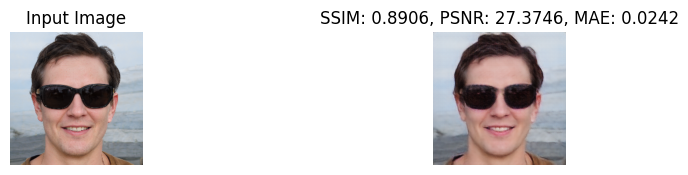

Epoch 11/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 193s 117ms/step - disc_x_loss: 1.3326 - disc_y_loss: 1.3681 - gen_f_loss: 1.5539 - gen_g_loss: 1.4433 - mae_x: 0.0561 - mae_y: 0.0508 - perceptual_loss_f: 3.2335 - perceptual_loss_g: 3.0588
Epoch 12/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 193s 118ms/step - disc_x_loss: 1.3336 - disc_y_loss: 1.3689 - gen_f_loss: 1.5548 - gen_g_loss: 1.4457 - mae_x: 0.0563 - mae_y: 0.0510 - perceptual_loss_f: 3.2227 - perceptual_loss_g: 3.0307
Epoch 13/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 193s 117ms/step - disc_x_loss: 1.3271 - disc_y_loss: 1.3702 - gen_f_loss: 1.5651 - gen_g_loss: 1.4422 - mae_x: 0.0567 - mae_y: 0.0511 - perceptual_loss_f: 3.2413 - perceptual_loss_g: 3.0561
Epoch 14/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 193s 118ms/step - disc_x_loss: 1.3309 - disc_y_loss: 1.3682 - gen_f_loss: 1.5426 - gen_g_loss: 1.4305 - mae_x: 0.0554 - mae_y: 0.0501 - perceptual_loss_f: 3.1936 - perceptual_loss_g: 2.9990
Epoch 15/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 193s 117ms/step - di

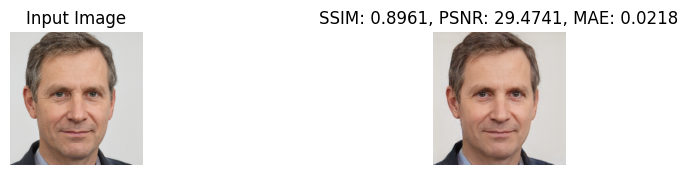

Epoch 21/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.3094 - disc_y_loss: 1.3684 - gen_f_loss: 1.5305 - gen_g_loss: 1.4048 - mae_x: 0.0538 - mae_y: 0.0490 - perceptual_loss_f: 3.2773 - perceptual_loss_g: 3.0446
Epoch 22/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.2984 - disc_y_loss: 1.3673 - gen_f_loss: 1.5537 - gen_g_loss: 1.4135 - mae_x: 0.0545 - mae_y: 0.0497 - perceptual_loss_f: 3.3141 - perceptual_loss_g: 2.9862
Epoch 23/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.2990 - disc_y_loss: 1.3682 - gen_f_loss: 1.5453 - gen_g_loss: 1.4013 - mae_x: 0.0541 - mae_y: 0.0488 - perceptual_loss_f: 3.2949 - perceptual_loss_g: 2.9757
Epoch 24/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.3121 - disc_y_loss: 1.3683 - gen_f_loss: 1.5294 - gen_g_loss: 1.3980 - mae_x: 0.0537 - mae_y: 0.0487 - perceptual_loss_f: 3.2761 - perceptual_loss_g: 2.9481
Epoch 25/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - di

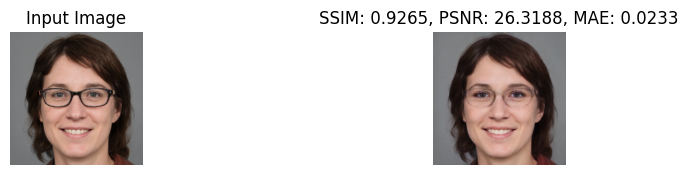

Epoch 31/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.3271 - disc_y_loss: 1.3649 - gen_f_loss: 1.4990 - gen_g_loss: 1.3822 - mae_x: 0.0533 - mae_y: 0.0479 - perceptual_loss_f: 3.2614 - perceptual_loss_g: 2.9514
Epoch 32/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.3245 - disc_y_loss: 1.3642 - gen_f_loss: 1.5124 - gen_g_loss: 1.3831 - mae_x: 0.0542 - mae_y: 0.0479 - perceptual_loss_f: 3.2481 - perceptual_loss_g: 2.9472
Epoch 33/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.3281 - disc_y_loss: 1.3638 - gen_f_loss: 1.5031 - gen_g_loss: 1.3836 - mae_x: 0.0538 - mae_y: 0.0480 - perceptual_loss_f: 3.2015 - perceptual_loss_g: 2.9125
Epoch 34/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.3292 - disc_y_loss: 1.3630 - gen_f_loss: 1.5016 - gen_g_loss: 1.3831 - mae_x: 0.0540 - mae_y: 0.0481 - perceptual_loss_f: 3.2054 - perceptual_loss_g: 2.9564
Epoch 35/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - di

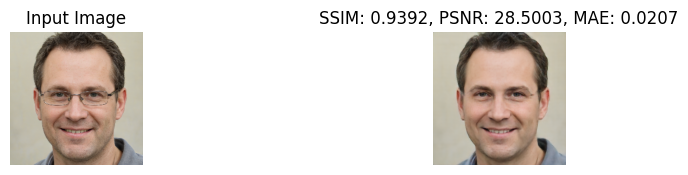

Epoch 41/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.3249 - disc_y_loss: 1.3400 - gen_f_loss: 1.5014 - gen_g_loss: 1.4189 - mae_x: 0.0543 - mae_y: 0.0488 - perceptual_loss_f: 3.1986 - perceptual_loss_g: 2.9682
Epoch 42/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.3255 - disc_y_loss: 1.3513 - gen_f_loss: 1.4947 - gen_g_loss: 1.3857 - mae_x: 0.0537 - mae_y: 0.0476 - perceptual_loss_f: 3.1379 - perceptual_loss_g: 2.9388
Epoch 43/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.3267 - disc_y_loss: 1.3384 - gen_f_loss: 1.4983 - gen_g_loss: 1.4289 - mae_x: 0.0541 - mae_y: 0.0491 - perceptual_loss_f: 3.2017 - perceptual_loss_g: 3.0122
Epoch 44/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.3229 - disc_y_loss: 1.3321 - gen_f_loss: 1.4971 - gen_g_loss: 1.4294 - mae_x: 0.0537 - mae_y: 0.0488 - perceptual_loss_f: 3.1982 - perceptual_loss_g: 2.9681
Epoch 45/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - di

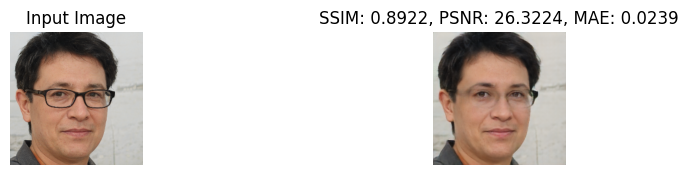

Epoch 51/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 193s 118ms/step - disc_x_loss: 1.3141 - disc_y_loss: 1.3298 - gen_f_loss: 1.5033 - gen_g_loss: 1.4219 - mae_x: 0.0536 - mae_y: 0.0489 - perceptual_loss_f: 3.1793 - perceptual_loss_g: 2.9374
Epoch 52/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.3112 - disc_y_loss: 1.3208 - gen_f_loss: 1.5080 - gen_g_loss: 1.4375 - mae_x: 0.0539 - mae_y: 0.0493 - perceptual_loss_f: 3.1839 - perceptual_loss_g: 2.9461
Epoch 53/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.3118 - disc_y_loss: 1.3101 - gen_f_loss: 1.5117 - gen_g_loss: 1.4616 - mae_x: 0.0541 - mae_y: 0.0496 - perceptual_loss_f: 3.1593 - perceptual_loss_g: 2.9457
Epoch 54/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.3073 - disc_y_loss: 1.3278 - gen_f_loss: 1.5069 - gen_g_loss: 1.4306 - mae_x: 0.0537 - mae_y: 0.0497 - perceptual_loss_f: 3.1866 - perceptual_loss_g: 2.9273
Epoch 55/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 193s 117ms/step - di

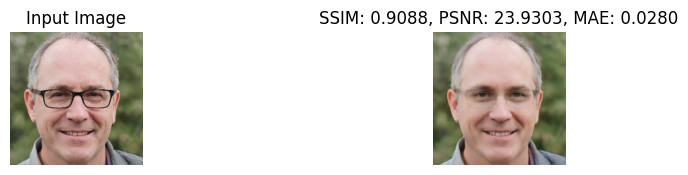

Epoch 61/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.3042 - disc_y_loss: 1.2819 - gen_f_loss: 1.5126 - gen_g_loss: 1.4923 - mae_x: 0.0536 - mae_y: 0.0500 - perceptual_loss_f: 3.1775 - perceptual_loss_g: 2.8826
Epoch 62/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.2995 - disc_y_loss: 1.2754 - gen_f_loss: 1.5172 - gen_g_loss: 1.4998 - mae_x: 0.0536 - mae_y: 0.0503 - perceptual_loss_f: 3.2013 - perceptual_loss_g: 2.8892
Epoch 63/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.2942 - disc_y_loss: 1.2496 - gen_f_loss: 1.5213 - gen_g_loss: 1.5468 - mae_x: 0.0536 - mae_y: 0.0509 - perceptual_loss_f: 3.1981 - perceptual_loss_g: 2.9120
Epoch 64/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.2869 - disc_y_loss: 1.2712 - gen_f_loss: 1.5270 - gen_g_loss: 1.5100 - mae_x: 0.0532 - mae_y: 0.0508 - perceptual_loss_f: 3.1615 - perceptual_loss_g: 2.9021
Epoch 65/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - di

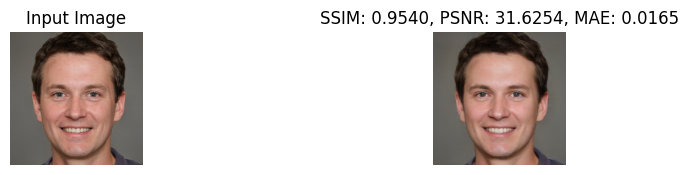

Epoch 71/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.2877 - disc_y_loss: 1.2346 - gen_f_loss: 1.5232 - gen_g_loss: 1.5708 - mae_x: 0.0531 - mae_y: 0.0515 - perceptual_loss_f: 3.1818 - perceptual_loss_g: 2.8760
Epoch 72/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.2873 - disc_y_loss: 1.2445 - gen_f_loss: 1.5286 - gen_g_loss: 1.5635 - mae_x: 0.0532 - mae_y: 0.0518 - perceptual_loss_f: 3.1692 - perceptual_loss_g: 2.8677
Epoch 73/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.2844 - disc_y_loss: 1.2237 - gen_f_loss: 1.5316 - gen_g_loss: 1.5955 - mae_x: 0.0535 - mae_y: 0.0521 - perceptual_loss_f: 3.1340 - perceptual_loss_g: 2.8724
Epoch 74/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.2845 - disc_y_loss: 1.2345 - gen_f_loss: 1.5295 - gen_g_loss: 1.5820 - mae_x: 0.0533 - mae_y: 0.0523 - perceptual_loss_f: 3.1492 - perceptual_loss_g: 2.8859
Epoch 75/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - di

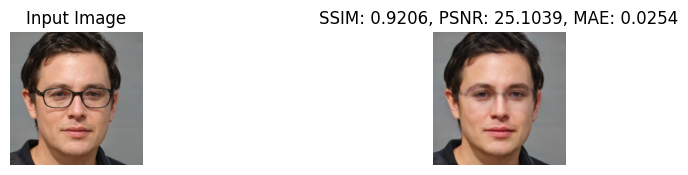

Epoch 81/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 195s 118ms/step - disc_x_loss: 1.2756 - disc_y_loss: 1.2066 - gen_f_loss: 1.5481 - gen_g_loss: 1.6312 - mae_x: 0.0538 - mae_y: 0.0527 - perceptual_loss_f: 3.1667 - perceptual_loss_g: 2.8578
Epoch 82/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.2755 - disc_y_loss: 1.2402 - gen_f_loss: 1.5389 - gen_g_loss: 1.5734 - mae_x: 0.0533 - mae_y: 0.0523 - perceptual_loss_f: 3.1411 - perceptual_loss_g: 2.8781
Epoch 83/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 194s 118ms/step - disc_x_loss: 1.2778 - disc_y_loss: 1.2028 - gen_f_loss: 1.5454 - gen_g_loss: 1.6371 - mae_x: 0.0535 - mae_y: 0.0529 - perceptual_loss_f: 3.1771 - perceptual_loss_g: 2.8745
Epoch 84/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 193s 118ms/step - disc_x_loss: 1.2700 - disc_y_loss: 1.2177 - gen_f_loss: 1.5446 - gen_g_loss: 1.6088 - mae_x: 0.0533 - mae_y: 0.0526 - perceptual_loss_f: 3.1676 - perceptual_loss_g: 2.8724
Epoch 85/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 193s 117ms/step - di

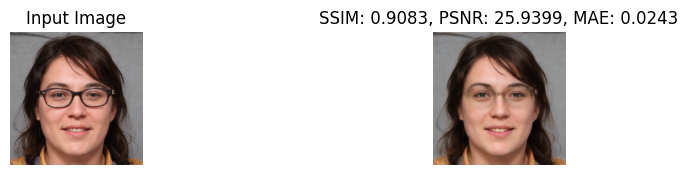

Epoch 91/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 193s 117ms/step - disc_x_loss: 1.2559 - disc_y_loss: 1.1895 - gen_f_loss: 1.5641 - gen_g_loss: 1.6536 - mae_x: 0.0536 - mae_y: 0.0532 - perceptual_loss_f: 3.1921 - perceptual_loss_g: 2.8788
Epoch 92/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 193s 117ms/step - disc_x_loss: 1.2597 - disc_y_loss: 1.1995 - gen_f_loss: 1.5592 - gen_g_loss: 1.6354 - mae_x: 0.0534 - mae_y: 0.0529 - perceptual_loss_f: 3.1705 - perceptual_loss_g: 2.8546
Epoch 93/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 193s 117ms/step - disc_x_loss: 1.2510 - disc_y_loss: 1.1846 - gen_f_loss: 1.5760 - gen_g_loss: 1.6683 - mae_x: 0.0538 - mae_y: 0.0530 - perceptual_loss_f: 3.1598 - perceptual_loss_g: 2.8642
Epoch 94/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 193s 117ms/step - disc_x_loss: 1.2584 - disc_y_loss: 1.1958 - gen_f_loss: 1.5637 - gen_g_loss: 1.6398 - mae_x: 0.0538 - mae_y: 0.0529 - perceptual_loss_f: 3.1473 - perceptual_loss_g: 2.8582
Epoch 95/100
1644/1644 ━━━━━━━━━━━━━━━━━━━━ 193s 117ms/step - di

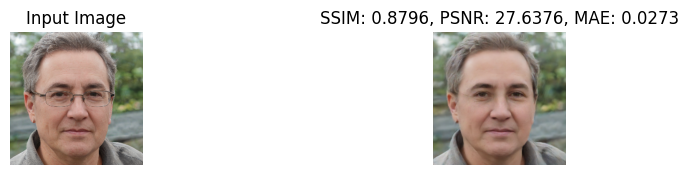

In [76]:
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import os
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, LeakyReLU, ReLU, BatchNormalization
from tensorflow.keras.applications import VGG19
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
import numpy as np

# ============================
# 🔹 DATA LOADING FUNCTIONS
# ============================
def load_image(image_file):
    """
    Load and preprocess individual images for the model
    - Reads image file
    - Decodes JPEG format
    - Resizes to uniform 256x256 dimensions
    - Normalizes pixel values to [-1, 1] range
    """
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image)
    image = tf.image.resize(image, [256, 256])  # Resize images
    image = (image / 127.5) - 1  # Normalize to [-1, 1]
    return image

def load_dataset(path):
    """
    Creates a dataset from a directory of images
    - Lists all PNG files in the directory
    - Maps the load_image function to each file
    - Batches the dataset for training
    """
    dataset = tf.data.Dataset.list_files(path + "/*.png")
    dataset = dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    dataset = dataset.batch(1)
    return dataset

# Define dataset paths (Update these paths with your actual dataset folders)
glasses_dataset = load_dataset("/content/working/glasses_images")
no_glasses_dataset = load_dataset("/content/working/no_glasses_images")

# ============================
# 🔹 CYCLEGAN MODEL DEFINITION WITH RESIDUAL BLOCKS & FINE-TUNING
# ============================
OUTPUT_CHANNELS = 3  # RGB images


def residual_block(x, filters, kernel_size=3):
    res = x
    x = Conv2D(filters, kernel_size, strides=1, padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Conv2D(filters, kernel_size, strides=1, padding='same')(x)
    x = BatchNormalization()(x)
    return tf.keras.layers.add([x, res])


def unet_generatorgenerator(output_channels, norm_type='instancenorm'):
    # Input Layer
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    # Downsampling
    down_stack = [
        Conv2D(64, 4, strides=2, padding='same', activation='relu'),
        Conv2D(128, 4, strides=2, padding='same', activation='relu'),
        Conv2D(256, 4, strides=2, padding='same', activation='relu')
    ]

    x = inputs
    # Apply down_stack layers sequentially
    for down in down_stack:
        x = down(x)

    # Add 6 residual blocks
    for _ in range(6):
        x = residual_block(x, 256)

    # Upsampling
    up_stack = [
        Conv2DTranspose(128, 4, strides=2, padding='same', activation='relu'),
        Conv2DTranspose(64, 4, strides=2, padding='same', activation='relu'),
        Conv2DTranspose(output_channels, 4, strides=2, padding='same', activation='tanh'),
    ]

    # Apply up_stack layers sequentially
    for up in up_stack:
        x = up(x)

    return tf.keras.Model(inputs=inputs, outputs=x)


# Discriminator model
def discriminator(norm_type='instancenorm', target=False):
    # Input Layer
    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')

    # Convolutional Layers
    x = Conv2D(64, 4, strides=2, padding='same')(inp)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(128, 4, strides=2, padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(256, 4, strides=2, padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)

    x = Conv2D(512, 4, strides=1, padding='same')(x)
    x = LeakyReLU(alpha=0.2)(x)

    # Output Layer
    x = Conv2D(1, 4, strides=1, padding='same')(x)

    return tf.keras.Model(inputs=inp, outputs=x)

# ============================
# 🔹 CYCLEGAN CLASS & TRAINING
# ============================
class CycleGan(tf.keras.Model):
    def __init__(self, generator_g, generator_f, discriminator_x, discriminator_y,
                 lambda_cycle=10.0,  # Increase cycle consistency weight
                 lambda_identity=5.0):  # Add identity loss
        super(CycleGan, self).__init__()
        self.generator_g = generator_g
        self.generator_f = generator_f
        self.discriminator_x = discriminator_x
        self.discriminator_y = discriminator_y
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity

    def compile(self, gen_g_optimizer, gen_f_optimizer, disc_x_optimizer, disc_y_optimizer, loss_fn, perceptual_loss_fn):
        # Make sure to call the compile method from tf.keras.Model
        super(CycleGan, self).compile()  # This calls the compile method from tf.keras.Model
        self.gen_g_optimizer = gen_g_optimizer
        self.gen_f_optimizer = gen_f_optimizer
        self.disc_x_optimizer = disc_x_optimizer
        self.disc_y_optimizer = disc_y_optimizer
        self.loss_fn = loss_fn
        self.perceptual_loss_fn = perceptual_loss_fn

    def train_step(self, batch_data):
        real_x, real_y = batch_data

        with tf.GradientTape(persistent=True) as tape:
            # Identity loss
            same_x = self.generator_f(real_x, training=True)
            same_y = self.generator_g(real_y, training=True)
            identity_loss_x = tf.reduce_mean(tf.abs(same_x - real_x)) * self.lambda_identity
            identity_loss_y = tf.reduce_mean(tf.abs(same_y - real_y)) * self.lambda_identity

            # Regular cycle gan losses
            fake_y = self.generator_g(real_x, training=True)
            cycled_x = self.generator_f(fake_y, training=True)

            fake_x = self.generator_f(real_y, training=True)
            cycled_y = self.generator_g(fake_x, training=True)

            # --- ADD PERCEPTUAL LOSS ---
            perceptual_loss_g = self.perceptual_loss_fn(real_y, fake_y) * 0.1
            perceptual_loss_f = self.perceptual_loss_fn(real_x, fake_x) * 0.1

            # Add noise to discriminator inputs
            noise_stddev = 0.005
            noisy_real_x = real_x + tf.random.normal(tf.shape(real_x), 0, noise_stddev)
            noisy_fake_x = fake_x + tf.random.normal(tf.shape(fake_x), 0, noise_stddev)
            noisy_real_y = real_y + tf.random.normal(tf.shape(real_y), 0, noise_stddev)
            noisy_fake_y = fake_y + tf.random.normal(tf.shape(fake_y), 0, noise_stddev)

            # Using the noisy images in discriminator
            disc_real_x = self.discriminator_x(noisy_real_x, training=True)
            disc_fake_x = self.discriminator_x(noisy_fake_x, training=True)

            disc_real_y = self.discriminator_y(noisy_real_y, training=True)
            disc_fake_y = self.discriminator_y(noisy_fake_y, training=True)

            # Calculate losses with gradient penalty
            gen_g_loss = self.loss_fn(tf.ones_like(disc_fake_y), disc_fake_y)
            gen_f_loss = self.loss_fn(tf.ones_like(disc_fake_x), disc_fake_x)

            cycle_loss_x = self.lambda_cycle * tf.reduce_mean(tf.abs(real_x - cycled_x))
            cycle_loss_y = self.lambda_cycle * tf.reduce_mean(tf.abs(real_y - cycled_y))

            total_loss_g = gen_g_loss + cycle_loss_y + identity_loss_y
            total_loss_f = gen_f_loss + cycle_loss_x + identity_loss_x

            # Calculate MAE for both domains
            mae_x = tf.reduce_mean(tf.abs(real_x - cycled_x))
            mae_y = tf.reduce_mean(tf.abs(real_y - cycled_y))

            # Add gradient penalty to discriminator losses
            disc_x_loss = self.loss_fn(tf.ones_like(disc_real_x), disc_real_x) + \
                         self.loss_fn(tf.zeros_like(disc_fake_x), disc_fake_x)
            disc_y_loss = self.loss_fn(tf.ones_like(disc_real_y), disc_real_y) + \
                         self.loss_fn(tf.zeros_like(disc_fake_y), disc_fake_y)

        gen_g_grads = tape.gradient(total_loss_g, self.generator_g.trainable_variables)
        gen_f_grads = tape.gradient(total_loss_f, self.generator_f.trainable_variables)
        disc_x_grads = tape.gradient(disc_x_loss, self.discriminator_x.trainable_variables)
        disc_y_grads = tape.gradient(disc_y_loss, self.discriminator_y.trainable_variables)

        self.gen_g_optimizer.apply_gradients(zip(gen_g_grads, self.generator_g.trainable_variables))
        self.gen_f_optimizer.apply_gradients(zip(gen_f_grads, self.generator_f.trainable_variables))
        self.disc_x_optimizer.apply_gradients(zip(disc_x_grads, self.discriminator_x.trainable_variables))
        self.disc_y_optimizer.apply_gradients(zip(disc_y_grads, self.discriminator_y.trainable_variables))

        return {"gen_g_loss": total_loss_g,"gen_f_loss": total_loss_f, "disc_x_loss": disc_x_loss, "disc_y_loss": disc_y_loss,"mae_x": mae_x,"mae_y": mae_y,"perceptual_loss_g": perceptual_loss_g,
        "perceptual_loss_f": perceptual_loss_f}

# ============================
# 🔹 SSIM and PSNR Calculation
# ============================


def ssim_psnr_mae_metrics(original_image, generated_image):
    # Convert tensors to numpy arrays and ensure they're float32
    try:
        # Handle if inputs are EagerTensor
        if tf.is_tensor(original_image):
            original_image = original_image.numpy()
        if tf.is_tensor(generated_image):
            generated_image = generated_image.numpy()

        # Convert from [-1, 1] to [0, 1] range
        original_image = (original_image + 1) / 2.0
        generated_image = (generated_image + 1) / 2.0

        # Ensure images are in valid range [0, 1]
        original_image = np.clip(original_image, 0, 1)
        generated_image = np.clip(generated_image, 0, 1)

        # Convert to float32
        original_image = original_image.astype(np.float32)
        generated_image = generated_image.astype(np.float32)

        # Calculate MAE
        mae_value = np.mean(np.abs(original_image - generated_image))

        # Set a small window size for SSIM
        win_size = 3
        ssim_value = ssim(original_image, generated_image,
                         multichannel=True,
                         win_size=win_size,
                         data_range=1.0)

        # Compute PSNR
        psnr_value = psnr(original_image, generated_image, data_range=1.0)

        return (tf.convert_to_tensor(ssim_value, dtype=tf.float32),
                tf.convert_to_tensor(psnr_value, dtype=tf.float32),
                tf.convert_to_tensor(mae_value, dtype=tf.float32))

    except Exception as e:
        print(f"Error in ssim_psnr_mae_metrics: {str(e)}")
        # Return default values in case of error
        return (tf.convert_to_tensor(0.0, dtype=tf.float32),
                tf.convert_to_tensor(0.0, dtype=tf.float32),
                tf.convert_to_tensor(0.0, dtype=tf.float32))



# ============================
# 🔹 IMAGE GENERATION FUNCTION WITH SSIM AND PSNR AND MAE
# ============================
def generate_images(model, test_inputs, num_samples=5):
    predictions = model(test_inputs, training=False)

    plt.figure(figsize=(10, 10))
    display_list = list(zip(test_inputs[:num_samples], predictions[:num_samples]))
    titles = ["Input Image", "Generated Image"]

    for i, (input_img, pred_img) in enumerate(display_list):
        # Plot input image
        plt.subplot(num_samples, 2, 2 * i + 1)
        plt.title(titles[0])
        plt.imshow((input_img + 1) / 2)
        plt.axis("off")

        # Plot generated image
        plt.subplot(num_samples, 2, 2 * i + 2)
        plt.imshow((pred_img + 1) / 2)
        plt.axis("off")

        # Calculate SSIM, PSNR, and MAE
        ssim_value, psnr_value, mae_value = ssim_psnr_mae_metrics(input_img, pred_img)

        # Display SSIM, PSNR, and MAE values
        plt.title(f"SSIM: {ssim_value:.4f}, PSNR: {psnr_value:.4f}, MAE: {mae_value:.4f}")

    plt.show()

# ============================
# 🔹 TRAINING CYCLEGAN
# ============================
# Initialize the generators and discriminators
generator_g = unet_generator(OUTPUT_CHANNELS)  # G: Glasses → No Glasses
generator_f = unet_generator(OUTPUT_CHANNELS)  # F: No Glasses → Glasses
discriminator_x = discriminator()  # Discriminator for domain X (Glasses)
discriminator_y = discriminator()  # Discriminator for domain Y (No Glasses)

# Create the VGG16 model once outside the perceptual_loss_fn
vgg_model = tf.keras.applications.VGG16(include_top=False, weights='imagenet')
vgg_model.trainable = False

def perceptual_loss_fn(real, generated):
    # Preprocess for VGG16
    real_preprocessed = tf.keras.applications.vgg16.preprocess_input((real + 1) * 127.5)
    generated_preprocessed = tf.keras.applications.vgg16.preprocess_input((generated + 1) * 127.5)

    # Extract feature maps
    real_features = vgg_model(real_preprocessed)
    generated_features = vgg_model(generated_preprocessed)

    # Compute perceptual loss (L2 norm between feature maps)
    loss = tf.reduce_mean(tf.square(real_features - generated_features))
    return loss



# Initialize the CycleGAN model
cycle_gan = CycleGan(generator_g, generator_f, discriminator_x, discriminator_y)

# compile your CycleGan model with the perceptual loss function
cycle_gan.compile(
    gen_g_optimizer=tf.keras.optimizers.Adam(1e-4, beta_1=0.5),  # Slower learning rate
    gen_f_optimizer=tf.keras.optimizers.Adam(1e-4, beta_1=0.5),
    disc_x_optimizer=tf.keras.optimizers.Adam(5e-5, beta_1=0.5),  # Even slower for discriminator
    disc_y_optimizer=tf.keras.optimizers.Adam(5e-5, beta_1=0.5),
    loss_fn=tf.keras.losses.BinaryCrossentropy(from_logits=True),
    perceptual_loss_fn=perceptual_loss_fn
)
# ============================
# 🔹 TRAINING CYCLEGAN WITH IMAGE GENERATION AND SSIM/PSNR
# ============================

EPOCHS = 100
for epoch in range(EPOCHS):
    print(f"Epoch {epoch + 1}/{EPOCHS}")

    # Training the model
    cycle_gan.fit(tf.data.Dataset.zip((glasses_dataset, no_glasses_dataset)), epochs=1)

    # Display generated images and SSIM/PSNR values every 5 epochs
    if (epoch + 1) % 10 == 0:
        sample_images = next(iter(glasses_dataset.take(5)))  # Take 5 sample images
        generate_images(cycle_gan.generator_g, sample_images)  # Generate images using the model

generator_g.save("glasses_to_no_glasses.h5")

In [77]:
from google.colab import files
files.download("glasses_to_no_glasses.h5")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>